In [45]:
# general libraries
import os
import sys
import math
import statistics
import collections
import missingno as msno
from pylab import MaxNLocator
from collections import defaultdict
import seaborn as sns
sns.set()
import ast
from pathlib import Path
# pandas libraries
import pandas as pd
from pandas import DataFrame
from pandas.testing import assert_frame_equal
import IPython.display as ipd

# visualisation libraries
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.graphics.gofplots import qqplot

# numpy libraries
import numpy as np
from numpy import std
from numpy import mean
from numpy import percentile

# scipy libraries
from scipy.stats import pearsonr

# sklearn libraries
from sklearn.impute import KNNImputer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.preprocessing import PolynomialFeatures
from sklearn.experimental import enable_iterative_imputer  # explicitly require this experimental feature
from sklearn.impute import IterativeImputer

In [46]:
tracks = pd.read_csv(r'C:\Users\jigok\OneDrive\Desktop\UniPISA\2semestre2Anno\DataMining2\Progetto\Data\fma_metadata\tracks.csv',low_memory=False,index_col=0, header=[0, 1])

COLUMNS = [('track', 'tags'), ('album', 'tags'),('artist', 'tags'),
           ('track', 'genres'), ('track', 'genres_all')]

for column in COLUMNS:
     tracks[column] = tracks[column].map(ast.literal_eval)
        
COLUMNS = [('track', 'date_created'), ('track', 'date_recorded'),
           ('album', 'date_created'), ('album', 'date_released'),
           ('artist', 'date_created'), ('artist', 'active_year_begin'),
           ('artist', 'active_year_end')]
for column in COLUMNS:
     tracks[column] = pd.to_datetime(tracks[column])
        
COLUMNS = [('track', 'genre_top'), ('track', 'license'),
           ('album', 'type'), ('album', 'information'),
           ('artist', 'bio')]
for column in COLUMNS:
            tracks[column] = tracks[column].astype('category')

In [47]:
tracks.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 106574 entries, 2 to 155320
Data columns (total 52 columns):
 #   Column                       Non-Null Count   Dtype         
---  ------                       --------------   -----         
 0   (album, comments)            106574 non-null  int64         
 1   (album, date_created)        103045 non-null  datetime64[ns]
 2   (album, date_released)       70294 non-null   datetime64[ns]
 3   (album, engineer)            15295 non-null   object        
 4   (album, favorites)           106574 non-null  int64         
 5   (album, id)                  106574 non-null  int64         
 6   (album, information)         83149 non-null   category      
 7   (album, listens)             106574 non-null  int64         
 8   (album, producer)            18060 non-null   object        
 9   (album, tags)                106574 non-null  object        
 10  (album, title)               105549 non-null  object        
 11  (album, tracks)           

In [48]:
ipd.display(tracks['track'].head())
ipd.display(tracks['album'].head())
ipd.display(tracks['artist'].head())
ipd.display(tracks['set'].head())

,bit_rate,comments,composer,date_created,date_recorded,duration,favorites,genre_top,genres,genres_all,information,interest,language_code,license,listens,lyricist,number,publisher,tags,title
track_id,,,,,,,,,,,,,,,,,,,,
2,256000,0,NaN,2008-11-26 01:48:12,2008-11-26,168,2,Hip-Hop,[21],[21],NaN,4656,en,Attribution-NonCommercial-ShareAlike 3.0 Inter...,1293,NaN,3,NaN,[],Food
3,256000,0,NaN,2008-11-26 01:48:14,2008-11-26,237,1,Hip-Hop,[21],[21],NaN,1470,en,Attribution-NonCommercial-ShareAlike 3.0 Inter...,514,NaN,4,NaN,[],Electric Ave
5,256000,0,NaN,2008-11-26 01:48:20,2008-11-26,206,6,Hip-Hop,[21],[21],NaN,1933,en,Attribution-NonCommercial-ShareAlike 3.0 Inter...,1151,NaN,6,NaN,[],This World
10,192000,0,Kurt Vile,2008-11-25 17:49:06,2008-11-26,161,178,Pop,[10],[10],NaN,54881,en,Attribution-NonCommercial-NoDerivatives (aka M...,50135,NaN,1,NaN,[],Freeway
20,256000,0,NaN,2008-11-26 01:48:56,2008-01-01,311,0,NaN,"[76, 103]","[17, 10, 76, 103]",NaN,978,en,Attribution-NonCommercial-NoDerivatives (aka M...,361,NaN,3,NaN,[],Spiritual Level


,comments,date_created,date_released,engineer,favorites,id,information,listens,producer,tags,title,tracks,type
track_id,,,,,,,,,,,,,
2,0,2008-11-26 01:44:45,2009-01-05,NaN,4,1,<p></p>,6073,NaN,[],AWOL - A Way Of Life,7,Album
3,0,2008-11-26 01:44:45,2009-01-05,NaN,4,1,<p></p>,6073,NaN,[],AWOL - A Way Of Life,7,Album
5,0,2008-11-26 01:44:45,2009-01-05,NaN,4,1,<p></p>,6073,NaN,[],AWOL - A Way Of Life,7,Album
10,0,2008-11-26 01:45:08,2008-02-06,NaN,4,6,NaN,47632,NaN,[],Constant Hitmaker,2,Album
20,0,2008-11-26 01:45:05,2009-01-06,NaN,2,4,"<p> ""spiritual songs"" from Nicky Cook</p>",2710,NaN,[],Niris,13,Album


,active_year_begin,active_year_end,associated_labels,bio,comments,date_created,favorites,id,latitude,location,longitude,members,name,related_projects,tags,website,wikipedia_page
track_id,,,,,,,,,,,,,,,,,
2,2006-01-01,NaT,NaN,"<p>A Way Of Life, A Collective of Hip-Hop from...",0,2008-11-26 01:42:32,9,1,40.058324,New Jersey,-74.405661,"Sajje Morocco,Brownbum,ZawidaGod,Custodian of ...",AWOL,The list of past projects is 2 long but every1...,[awol],http://www.AzillionRecords.blogspot.com,NaN
3,2006-01-01,NaT,NaN,"<p>A Way Of Life, A Collective of Hip-Hop from...",0,2008-11-26 01:42:32,9,1,40.058324,New Jersey,-74.405661,"Sajje Morocco,Brownbum,ZawidaGod,Custodian of ...",AWOL,The list of past projects is 2 long but every1...,[awol],http://www.AzillionRecords.blogspot.com,NaN
5,2006-01-01,NaT,NaN,"<p>A Way Of Life, A Collective of Hip-Hop from...",0,2008-11-26 01:42:32,9,1,40.058324,New Jersey,-74.405661,"Sajje Morocco,Brownbum,ZawidaGod,Custodian of ...",AWOL,The list of past projects is 2 long but every1...,[awol],http://www.AzillionRecords.blogspot.com,NaN
10,NaT,NaT,"Mexican Summer, Richie Records, Woodsist, Skul...","<p><span style=""font-family:Verdana, Geneva, A...",3,2008-11-26 01:42:55,74,6,NaN,NaN,NaN,"Kurt Vile, the Violators",Kurt Vile,NaN,"[philly, kurt vile]",http://kurtvile.com,NaN
20,1990-01-01,2011-01-01,NaN,<p>Songs written by: Nicky Cook</p>\n<p>VOCALS...,2,2008-11-26 01:42:52,10,4,51.895927,Colchester England,0.891874,Nicky Cook\n,Nicky Cook,NaN,"[instrumentals, experimental pop, post punk, e...",NaN,NaN


,split,subset
track_id,,
2,training,small
3,training,medium
5,training,small
10,training,small
20,training,large


In [49]:
column_names = tuple(tracks.columns)
print("nome tupla:", column_names)

nome tupla: (('album', 'comments'), ('album', 'date_created'), ('album', 'date_released'), ('album', 'engineer'), ('album', 'favorites'), ('album', 'id'), ('album', 'information'), ('album', 'listens'), ('album', 'producer'), ('album', 'tags'), ('album', 'title'), ('album', 'tracks'), ('album', 'type'), ('artist', 'active_year_begin'), ('artist', 'active_year_end'), ('artist', 'associated_labels'), ('artist', 'bio'), ('artist', 'comments'), ('artist', 'date_created'), ('artist', 'favorites'), ('artist', 'id'), ('artist', 'latitude'), ('artist', 'location'), ('artist', 'longitude'), ('artist', 'members'), ('artist', 'name'), ('artist', 'related_projects'), ('artist', 'tags'), ('artist', 'website'), ('artist', 'wikipedia_page'), ('set', 'split'), ('set', 'subset'), ('track', 'bit_rate'), ('track', 'comments'), ('track', 'composer'), ('track', 'date_created'), ('track', 'date_recorded'), ('track', 'duration'), ('track', 'favorites'), ('track', 'genre_top'), ('track', 'genres'), ('track', 

In [50]:
#prova1
column_names = tuple(tracks.columns)
for column_name in column_names: 
    unique_values = []
    unique_values.append(tracks[column_name])
    print("Colonna:",column_name, unique_values, sep="\t")

Colonna:	('album', 'comments')	[track_id
2         0
3         0
5         0
10        0
20        0
         ..
155316    0
155317    0
155318    0
155319    0
155320    0
Name: (album, comments), Length: 106574, dtype: int64]
Colonna:	('album', 'date_created')	[track_id
2        2008-11-26 01:44:45
3        2008-11-26 01:44:45
5        2008-11-26 01:44:45
10       2008-11-26 01:45:08
20       2008-11-26 01:45:05
                 ...        
155316   2017-03-30 15:20:35
155317   2017-03-30 15:20:35
155318   2017-03-30 15:20:35
155319   2017-03-30 15:20:35
155320   2017-03-26 16:22:18
Name: (album, date_created), Length: 106574, dtype: datetime64[ns]]
Colonna:	('album', 'date_released')	[track_id
2        2009-01-05
3        2009-01-05
5        2009-01-05
10       2008-02-06
20       2009-01-06
            ...    
155316   2017-02-17
155317   2017-02-17
155318   2017-02-17
155319   2017-02-17
155320   2017-03-26
Name: (album, date_released), Length: 106574, dtype: datetime64[ns]]
Colon

# Visualizzazione Distribuzioni

# Analisi Valori Interi

In [51]:
df_mod = tracks.select_dtypes(include=['int64'])
df_mod.dtypes

album   comments     int64
        favorites    int64
        id           int64
        listens      int64
        tracks       int64
artist  comments     int64
        favorites    int64
        id           int64
track   bit_rate     int64
        comments     int64
        duration     int64
        favorites    int64
        interest     int64
        listens      int64
        number       int64
dtype: object

Analisi delle distribuzioni con plot-histogram per ALBUM

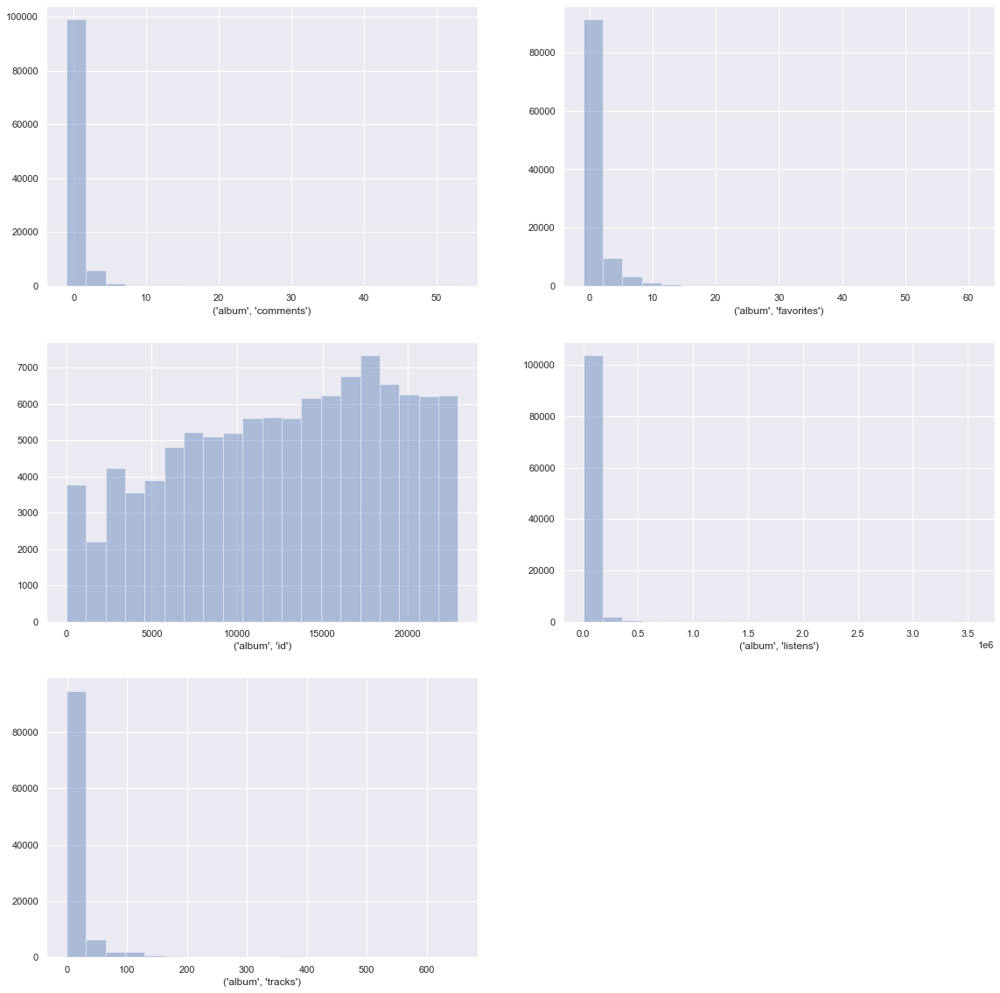

In [52]:
fig =plt.subplots(figsize=(30, 20))
fig_dims = (3, 3)

ax = plt.subplot2grid(fig_dims, (0, 0))
sns.distplot(tracks["album", "comments"].dropna(), kde=False,bins=20)
ax = plt.subplot2grid(fig_dims, (0, 1))
sns.distplot(tracks["album", "favorites"].dropna(), kde=False,bins=20)
ax = plt.subplot2grid(fig_dims, (1, 0))
sns.distplot(tracks["album", "id"].dropna(), kde=False,bins=20)
ax = plt.subplot2grid(fig_dims, (1, 1))
sns.distplot(tracks["album", "listens"].dropna(), kde=False,bins=20)
ax = plt.subplot2grid(fig_dims, (2, 0))
sns.distplot(tracks["album", "tracks"].dropna(), kde=False,bins=20)

plt.show()

In [53]:
tracks["album", "comments"].value_counts()

 0     84660
 1     10858
-1      3529
 2      3442
 3      1669
 4       737
 5       384
 6       341
 53      139
 14      135
 8       133
 7       132
 11      125
 10      117
 9        91
 17       71
 13        9
 12        2
Name: (album, comments), dtype: int64

In [54]:
tracks["album", "favorites"].value_counts()


 0     53679
 1     23757
 2     10349
 3      5366
-1      3529
 4      2542
 5      1707
 6      1330
 7       942
 8       898
 10      422
 11      373
 12      297
 9       293
 14      159
 13       99
 23       75
 16       74
 19       71
 25       69
 17       66
 18       58
 31       49
 15       41
 55       38
 24       31
 22       29
 20       28
 29       26
 21       20
 28       20
 39       18
 26       15
 40       15
 47       14
 27       12
 61       10
 38       10
 33        9
 60        9
 43        7
 54        7
 37        6
 36        5
Name: (album, favorites), dtype: int64

Analisi delle distribuzioni con plot-histogram per ARTIST

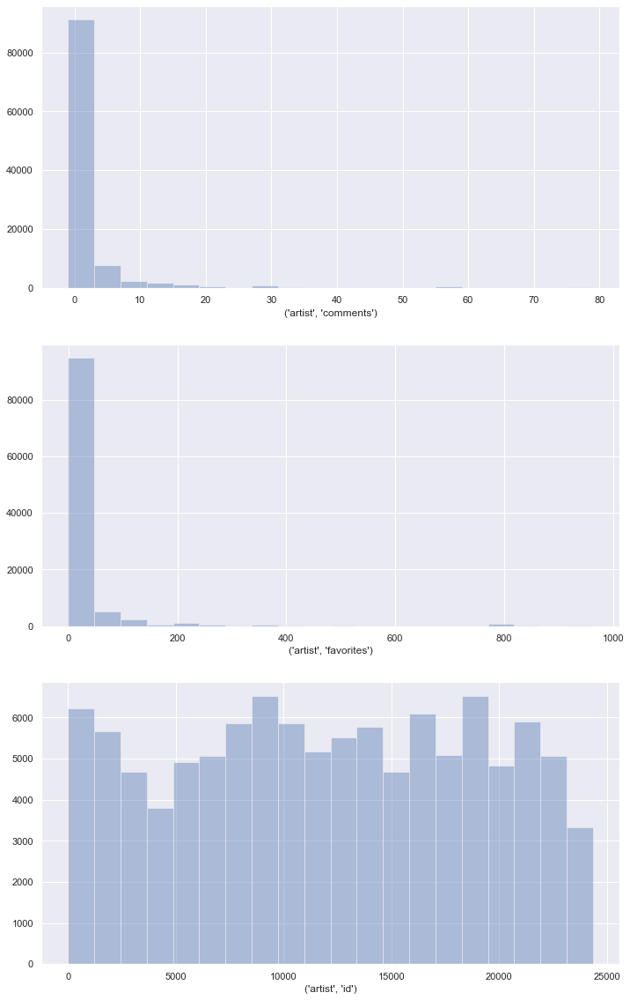

In [55]:
fig =plt.subplots(figsize=(40, 20))
fig_dims = (3, 3)

ax = plt.subplot2grid(fig_dims, (0, 0))
sns.distplot(tracks["artist", "comments"].dropna(), kde=False,bins=20)
ax = plt.subplot2grid(fig_dims, (1, 0))
sns.distplot(tracks["artist", "favorites"].dropna(), kde=False,bins=20)
ax = plt.subplot2grid(fig_dims, (2, 0))
sns.distplot(tracks["artist", "id"].dropna(), kde=False,bins=20)

Analisi delle distribuzioni con plot-histogram per TRACK

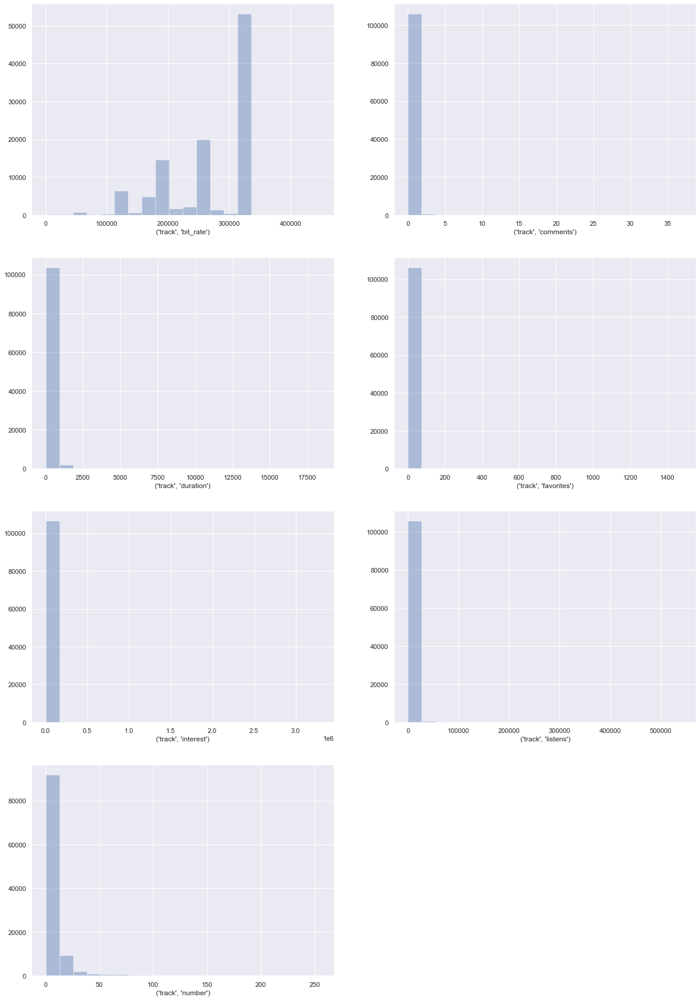

In [56]:
fig =plt.subplots(figsize=(20, 30))
fig_dims = (4, 2)

ax = plt.subplot2grid(fig_dims, (0, 0))
sns.distplot(tracks["track", "bit_rate"].dropna(), kde=False,bins=20)
ax = plt.subplot2grid(fig_dims, (0, 1))
sns.distplot(tracks["track", "comments"].dropna(), kde=False,bins=20)
ax = plt.subplot2grid(fig_dims, (1, 0))
sns.distplot(tracks["track", "duration"].dropna(), kde=False,bins=20)
ax = plt.subplot2grid(fig_dims, (1, 1))
sns.distplot(tracks["track", "favorites"].dropna(), kde=False,bins=20)
ax = plt.subplot2grid(fig_dims, (2, 0))
sns.distplot(tracks["track", "interest"].dropna(), kde=False,bins=20)
ax = plt.subplot2grid(fig_dims, (2, 1))
sns.distplot(tracks["track", "listens"].dropna(), kde=False,bins=20)
ax = plt.subplot2grid(fig_dims, (3, 0))
sns.distplot(tracks["track", "number"].dropna(), kde=False,bins=20)

plt.show()

In [57]:
tracks["track", "comments"].value_counts()

0     104423
1       1508
2        415
3        133
4         40
5         19
6         10
7          5
8          5
9          4
10         3
12         2
16         2
30         1
11         1
19         1
24         1
37         1
Name: (track, comments), dtype: int64

In [58]:
tracks["track", "interest"]

track_id
2          4656
3          1470
5          1933
10        54881
20          978
          ...  
155316      122
155317      194
155318      214
155319      336
155320      972
Name: (track, interest), Length: 106574, dtype: int64

In [59]:
tracks["track", "interest"].unique()

array([ 4656,  1470,  1933, ...,    13,    18, 22877], dtype=int64)

In [60]:
tracks["track", "number"].value_counts()

1      12419
2      11214
3      10379
4       9551
5       8471
       ...  
175        1
154        1
218        1
229        1
158        1
Name: (track, number), Length: 246, dtype: int64

In [61]:
tracks["track", "number"].unique()

array([  3,   4,   6,   1,   5,   8,   9,   0,   2,   7,  11,  10,  12,
        13,  14,  15,  16,  17,  19,  18,  20,  23,  21,  22,  25,  24,
       100,  66,  41,  42,  32,  40,  36,  30,  29,  28,  31,  39,  33,
        26,  27,  37,  35,  34,  43,  38,  44,  45,  54,  47,  50,  46,
        48,  49,  51,  52,  53,  55,  56,  57,  58,  59,  60,  61,  62,
        63,  64,  65,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,
        77,  78,  79,  80,  87, 255, 101, 102, 103, 104, 105, 106, 107,
       108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120,
       201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213,
       214, 215, 216, 217,  81,  82,  83,  84,  85,  86,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 121, 122, 123, 124,
       125, 126, 127, 128, 129, 134, 130, 131, 135, 136, 132, 133, 227,
       138, 142, 137, 145, 153, 147, 144, 148, 151, 149, 146, 150, 139,
       140, 152, 141, 143, 156, 160, 158, 154, 159, 155, 157, 16

In [62]:
tracks["track", "listens"].value_counts()

96       140
97       136
141      133
112      130
152      129
        ... 
8742       1
10791      1
23081      1
8806       1
0          1
Name: (track, listens), Length: 12035, dtype: int64

# Analisi valori FLOAT

In [63]:
df_mod = tracks.select_dtypes(include=['float64'])
df_mod.dtypes

artist  latitude     float64
        longitude    float64
dtype: object

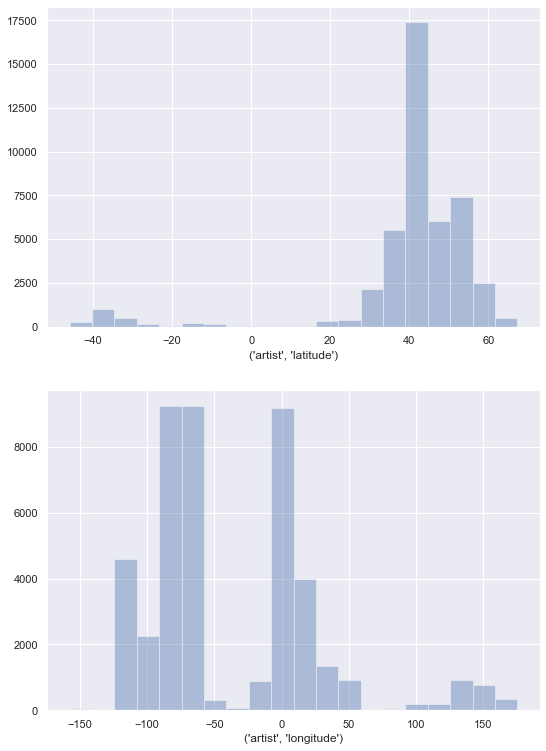

In [64]:
fig =plt.subplots(figsize=(30, 20))
fig_dims = (3, 3)

ax = plt.subplot2grid(fig_dims, (0, 0))
sns.distplot(tracks["artist", "latitude"].dropna(), kde=False,bins=20)
ax = plt.subplot2grid(fig_dims, (1, 0))
sns.distplot(tracks["artist", "longitude"].dropna(), kde=False,bins=20)

# Analisi valori OBJECT

In [65]:
df_mod = tracks.select_dtypes(include=['object'])
df_mod.dtypes

album   engineer             object
        producer             object
        tags                 object
        title                object
artist  associated_labels    object
        location             object
        members              object
        name                 object
        related_projects     object
        tags                 object
        website              object
        wikipedia_page       object
set     split                object
        subset               object
track   composer             object
        genres               object
        genres_all           object
        information          object
        language_code        object
        lyricist             object
        publisher            object
        tags                 object
        title                object
dtype: object

Trasformo la variabile object album,engenieer in categorica

In [66]:
tracks["album", "engineer"].unique()

array([nan, 'Ariel Pink', 'Dave Public',
       'Brian Mumform (teen sports! no rules! studio)', 'self-recorded',
       'Jason Engel', 'Scott Williams', 'Michael Goodstein',
       'Trent Wolbe', 'Diane Farris and Stu Ritherford', 'Irene Trudel',
       'Gil Shuster', 'Bil Bowen', 'Brandon Perry', 'Glenn Luttman',
       'Chris Stubbs', 'Jason Sigal with Adrian Caballero',
       'Gil Schuster', 'Richard Rusincovitch', 'Diane Farris',
       'Joe Belock', 'Charles Maggio', 'Rob Hatch-Miller',
       'Jesse Cannon and Dianne Kamikaze', 'Evan Muse', 'Stu Rutherford',
       'Diane', 'Cosmic Cowboy', 'Richard Rusincovich', 'Mark Triant',
       'Jesse Chan', 'Jason Sigal & Dylan Going', 'Jesse Cannon',
       'James Theesfield', 'Scott McDowell', 'Bill Bowen',
       'James Theesfeld', 'Veronica Liu', 'Diane Farris & Stu Rutherford',
       'Steven R Smith', 'Dave Amels', 'Trent Wolbe and Diane Farris',
       'Doron', 'Diane Farris and Irene Trudel',
       'Dave Amales, Stu Rutherford,

In [67]:
tracks["album", "engineer"] = tracks["album", "engineer"].astype("category")

In [68]:
tracks["album", "engineer"].value_counts()

Ernie Indradat                    876
Mike Sin                          701
Irene Trudel                      603
Glenn Luttman                     545
Mario Santana                     533
                                 ... 
Doron                               1
Brian Turner                        1
Jon Flores & Frank Lopez            1
Bryan Smith; Kenneth Kirschner      1
Jeff Mullan                         1
Name: (album, engineer), Length: 622, dtype: int64

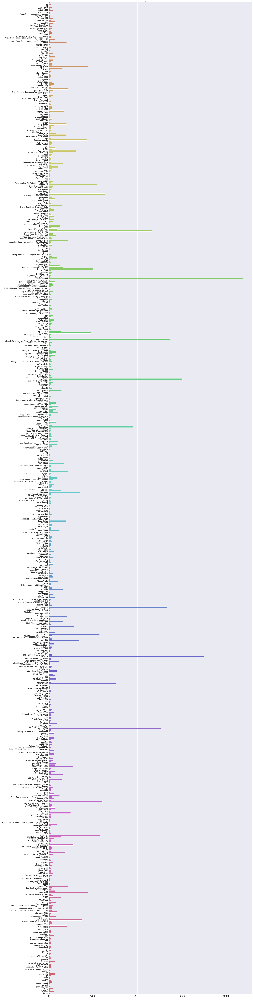

In [69]:
fig =plt.subplots(figsize=(40, 200))
sns.countplot(y=("album", "engineer"), data=tracks, palette='hls')
plt.title('Frequency of album engenieer')
plt.yticks(fontsize=20)
plt.xticks(fontsize=40)
plt.show()

Trasformo la variabile album, producer

In [70]:
tracks["album", "producer"].unique()

array([nan, 'Alec K. Refearn, Rob Pemberton', 'Tom Buckland',
       'Chief Boima, Oro 11', 'Griffin Rodriguez', 'Dylan Going',
       'Weasel Walter', 'Philip Manley', 'Brian Mumform', 'Johnny Jewel',
       'Greg Ashley', 'Bobb Bruno', 'Mike Rep & Drew Clausen',
       'Phil Elverum', 'Shawn Greenlee', 'Jimmy Hollywood', 'Mike Rep',
       'Terre T', 'Stork', 'Acapulco Rodriguez', 'Liz Berg',
       'Irene Trudel', 'Jason Sigal', 'Brian Turner',
       'Evan "Funk" Davies', 'Keili Hamilton', 'Joe Belock', 'OCDJ',
       'Pat Duncan', 'Pseu Braun', 'Rob Hatch-Miller', 'Scott Williams',
       'Dan Bodah', 'Diane Kamikaze', 'Bethany Ryker', 'Rob Weisberg',
       'Marty McSorley', 'Scott McDowell', 'Rob Weisberg ', 'Rob Lim',
       'Liz French', 'Steven R Smith', 'Evan ', 'WFMU',
       'Michael Goodstein', 'Mike Lupica', 'Dan Deacon', 'Evan Davies',
       'Hayvanlar Alemi', 'Aaron Spectre', 'The Apartment', 'Bob Wiseman',
       'Trouble', 'The Space Lady', 'Jane Shields', 'Kurt Got

In [71]:
tracks["album", "producer"] = tracks["album", "producer"].astype("category")

In [72]:
tracks["album", "producer"].value_counts()

Joe Belock                                    855
Terre T                                       819
Classwar Karaoke                              530
Rob Weisberg                                  459
Evan "Funk" Davies                            441
                                             ... 
Donna                                           1
Dj Patrizio                                     1
Nynack                                          1
Otis Fodder                                     1
Richard Alexander Caraballo/Justin Douglas      1
Name: (album, producer), Length: 760, dtype: int64

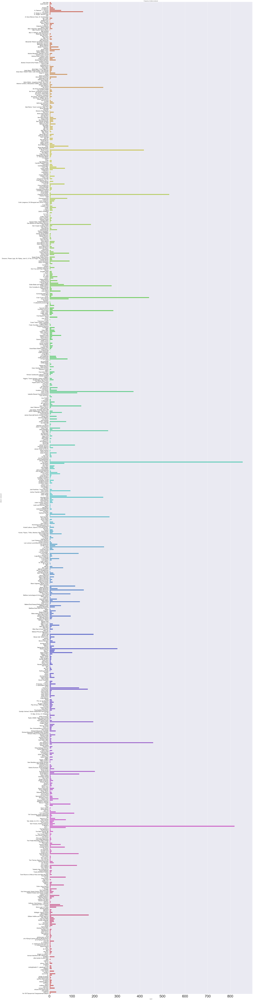

In [73]:
fig =plt.subplots(figsize=(40, 200))
sns.countplot(y=("album", "producer"), data=tracks, palette='hls')
plt.title('Frequency of album producer')
plt.yticks(fontsize=15)
plt.xticks(fontsize=40)
plt.show()

Analizzo album,tags

In [74]:
print(tracks["album", "tags"])

track_id
2                                                        []
3                                                        []
5                                                        []
10                                                       []
20                                                       []
                                ...                        
155316                                                   []
155317                                                   []
155318                                                   []
155319                                                   []
155320    [ballad, epic, rockabilly, curse, hex, hard ro...
Name: (album, tags), Length: 106574, dtype: object


In [75]:
"".join([str(_) for _ in  tracks["album", "tags"]])

"[][][][][][][][][][][][]['lafms']['lafms'][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][

In [76]:
tracks["album", "tags"].value_counts()

[]                                                                                                                                                         83549
[interiors c1964, existential, hardcore-punk, pop-punk, punk-rock, internet boyfriend, rew starr, public domain, creative commons, microsong challenge]      310
[classwar karaoke]                                                                                                                                           238
[all styles experimental]                                                                                                                                    215
[improvisation, not normal music, all styles experimental]                                                                                                   195
                                                                                                                                                           ...  
[murmurists, spe_0020, anthony don

Analisi Album Title, lo converto in category

In [77]:
tracks["album", "title"].unique()

array(['AWOL - A Way Of Life', 'Constant Hitmaker', 'Niris', ...,
       'Scissors Paper Stone',
       'Live at WFMU with Scott Williams, 3/27/2017',
       'Live at Monty Hall, 2/17/2017'], dtype=object)

In [78]:
tracks["album", "title"] = tracks["album", "title"].astype("category")

In [79]:
tracks["album", "title"].value_counts()

microSong Entries                                              310
Sectioned v4.0                                                 200
Live at the 2014 Golden Festival                               168
INTO INFINITY: an exploration of on and on and on and on...    151
Necktar Volume 6                                               150
                                                              ... 
Quick Be The Feet....(That Run To Mischief)                      1
Quiet the Mind (DCV)                                             1
Quilt Series Vol 14                                              1
Quincas Berro Dágua                                              1
Der Lift                                                         1
Name: (album, title), Length: 14298, dtype: int64

Analist Artist, associated table

In [80]:
tracks["artist", "associated_labels"].unique()

array([nan, 'Mexican Summer, Richie Records, Woodsist, Skulltones',
       'Los Angeles Free Music Society, Harbinger Sound', 'Breathmint',
       'Free Matter for the Blind', 'Below PDX, Trash Skull',
       'Ballbearings Pinatas, Vinyl International, <a href="http://www.4ad.com/ariel-pinks-haunted-graffiti/">4AD</a>',
       'ESP-Disk, Spinning Gold',
       'Aagoo, Oedipus, Popfrenzy, Inpartmaint', 'Crucial Blast',
       'Tequila Sunrise', 'Snurp', 'Tape Mountain',
       'Captcha Records (HBSP-2X), Pickled Egg (Europe)', 'Ironmilitis',
       'Floboto', 'Load Records', 'Goner, Shit Sandwich, Covert POP!',
       'Hip Hop Slam', 'Upset! the Rhythm', 'Museum Fire, VHf',
       'Thrill Jockey, Hit-Dat',
       'Awesome Vistas, Smells Delicious, Freedom to Spend, OMS-B',
       'Formed', 'Horse Imprint', 'ugExplode', 'Cock Rock Disco, Hoss',
       'Criminal IQ, Electrorock, Big Neck!, Wrench, Goodbye Boozy',
       'Eclipse Records, Ecstatic Peace! Records, ATP Records, Time-Lag Reco

In [81]:
tracks["artist", "associated_labels"] = tracks["artist", "associated_labels"].astype("category")

In [82]:
tracks["artist", "associated_labels"].value_counts()

HUSH Records                                                                                                       604
Care in the Community Recordings, Gagarin Records, Soleilmoon Recordings, Womb Records                             499
eg0cide, Withering Trees, Art1ficial Records, Black Circle Records, Kava Karvup Recordings, Effluvia Recordings    333
Daddy Tank Records                                                                                                 290
Parenthetical Records                                                                                              286
                                                                                                                  ... 
Ikuisuus, Freak Animal, Foxglove                                                                                     1
Ikuisuus, Jozik, Sloow Tapes, Troglosound                                                                            1
Ikuisuus, The Beard Of Snails                   

In [83]:
fig =plt.subplots(figsize=(40, 300))
sns.countplot(y=("artist", "associated_labels"), data=tracks, palette='hls')
plt.title('Frequency of associated labels')
plt.yticks(fontsize=10)
plt.xticks(fontsize=40)
plt.show()

C:\Users\jigok\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:214: RuntimeWarning: Glyph 9 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\jigok\anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:183: RuntimeWarning: Glyph 9 missing from current font.
  font.set_text(s, 0, flags=flags)


Analisi Artist, location

In [84]:
tracks["artist", "location"].unique()

array(['New Jersey', nan, 'Colchester England', ...,
       'Cheongju Si, South Korea\n\n', 'USA > Missouri',
       'Helsinki / Finland'], dtype=object)

In [85]:
tracks["artist", "location"] = tracks["artist", "location"].astype("category")

In [86]:
tracks["artist", "location"].value_counts()

Brooklyn, NY                         2327
France                               1737
New York, NY                         1218
Chicago, IL                           783
Perm, Russia                          745
                                     ... 
Melbourne, 3058, Australia              1
Toronto, Canada (born Colombian)        1
Kisumu                                  1
Chiapas, Mexico / Berlin, Germany       1
Plymouth, United Kingdom                1
Name: (artist, location), Length: 2329, dtype: int64

In [163]:
#scommentare per avere l'otput

#fig =plt.subplots(figsize=(40, 300))
#sns.countplot(y=("artist", "location"), data=tracks, palette='hls')
#plt.title('Frequency of associated labels')
#plt.yticks(fontsize=10)
#plt.xticks(fontsize=40)
#plt.show()

Analisi artist, member

In [88]:
tracks["artist", "members"].unique()

array(['Sajje Morocco,Brownbum,ZawidaGod,Custodian of Records,Zooberelli the Don,F.A.H,MadSicka,Damien Omenicci..and a van load more...',
       'Kurt Vile, the Violators', 'Nicky Cook\n', ..., 'sergio sánchez',
       'Max\nNastia', 'GILLIAN/JENNA/DECLAN/JAIME'], dtype=object)

In [89]:
tracks["artist", "members"] = tracks["artist", "members"].astype("category")
tracks["artist", "members"].value_counts()

Konstantin Trokay                                                                                                                                                                                                                                                           745
Chad Crouch                                                                                                                                                                                                                                                                 615
Lee Rosevere                                                                                                                                                                                                                                                                380
Hollis Smith                                                                                                                                                                            

Analisi Artist,name

In [90]:
tracks["artist", "name"].unique()

array(['AWOL', 'Kurt Vile', 'Nicky Cook', ...,
       'Alex Mason/BlackSunAeon Music', 'AWOTT', 'Spowder'], dtype=object)

In [91]:
tracks["artist", "name"] = tracks["artist", "name"].astype("category")
tracks["artist", "name"].value_counts()

Kosta T                745
Podington Bear         604
Ergo Phizmiz           499
Blue Dot Sessions      416
Lee Rosevere           371
                      ... 
Milanese                 1
Mikuś Meets 66North      1
Mikrochip No32           1
Mikimo Sosumi            1
"Blue" Gene Tyranny      1
Name: (artist, name), Length: 16294, dtype: int64

Analist artist related project

In [92]:
tracks["artist", "related_projects"].unique()

array(['The list of past projects is 2 long but every1 and every style from Tabby Bonet 2 M.O.P..Azillion Records Flagship trackmaster DJ BrownBum is a beat Wizard.....A-2-Z..illion....(right now working with JerseyBlock Ent)',
       nan,
       'Los Angeles Free Music Society, the Banshees, Le Forte Four, Human Hands',
       'Haldols, Amoebic Ensemble, Mr. Gutter', 'Septimania',
       'Flying Luttenbachers, Lake of Dracula, Xbxrx, Burmese, Lair of the Minotaur, Panicsville',
       'Kitty Midwife',
       'Animal Writes, Ghost to Falco, Soup Purse, Noise Divorce, Bird Costumes, Alarmist, Space Hawk, Sex with Girls',
       'John Maus', 'Oro11',
       'jmmj, frank difficult, Anntastic, Head Of Horns, Bellows, Nicotina and the Legs, Rustbucket, Black Faced Sheep, Mrs. Six Eyes',
       'Lopez, The Icarus Line', 'The Strapping Fieldhands',
       "Qulfus, Carla Bozulich's Evangelista",
       'White Mice, Suffering Bastard, JKAE, Battlesnake, Rhythm and Blues Motherfuckers',
       "

In [93]:
tracks["artist", "related_projects"] = tracks["artist", "related_projects"].astype("category")
tracks["artist", "related_projects"].value_counts()

Ratatat, Lullatone, Nightmares On Wax, Air, Mouse On Mars, Helios, Goldmund                                                                                                                                         604
The Electric Amygdala\nRockit Maxx                                                                                                                                                                                  371
Hafrsfjord\nThe Pardos                                                                                                                                                                                              286
Trans Atlantic Rage\nTrans Atlantic Rage/Balogh\nBad Night Moon Shadow\nBohorquez/Balogh Project\nAniqatia\nPink Hex\nLife Like Thunderstorms\nWondertaker\nCharles Rice Goff III/Jared C. Balogh\nDMAH/Balogh\n    248
Jubal, Boudewijn                                                                                                                        

Analisi artist, tags (piango)

In [94]:
print(tracks["artist", "tags"])

track_id
2                                                    [awol]
3                                                    [awol]
5                                                    [awol]
10                                      [philly, kurt vile]
20        [instrumentals, experimental pop, post punk, e...
                                ...                        
155316                                            [spowder]
155317                                            [spowder]
155318                                            [spowder]
155319                                            [spowder]
155320    [forget the whale, witches, rockabilly, rb, rn...
Name: (artist, tags), Length: 106574, dtype: object


In [95]:
"".join([str(_) for _ in  tracks["artist", "tags"]])

"['awol']['awol']['awol']['philly', 'kurt vile']['instrumentals', 'experimental pop', 'post punk', 'experimental rock', 'soundtracks', 'lo fi', 'nicky', 'impro', 'cook', 'nicky andrews', 'ukelele', 'nicky cook', 'singer songwriter', 'tabla']['instrumentals', 'experimental pop', 'post punk', 'experimental rock', 'soundtracks', 'lo fi', 'nicky', 'impro', 'cook', 'nicky andrews', 'ukelele', 'nicky cook', 'singer songwriter', 'tabla']['instrumentals', 'experimental pop', 'post punk', 'experimental rock', 'soundtracks', 'lo fi', 'nicky', 'impro', 'cook', 'nicky andrews', 'ukelele', 'nicky cook', 'singer songwriter', 'tabla']['instrumentals', 'experimental pop', 'post punk', 'experimental rock', 'soundtracks', 'lo fi', 'nicky', 'impro', 'cook', 'nicky andrews', 'ukelele', 'nicky cook', 'singer songwriter', 'tabla']['instrumentals', 'experimental pop', 'post punk', 'experimental rock', 'soundtracks', 'lo fi', 'nicky', 'impro', 'cook', 'nicky andrews', 'ukelele', 'nicky cook', 'singer songwrit

In [96]:
tracks["artist", "tags"].value_counts()

[]                                                                                                                                                                                                   3061
[skripka, improv, ambient, reverb, acoustic, free improvisation, psychedelic, melancholic, surrism-phonethics, kosta t, surrism-phonoethics, violin, avant garde, modern classical, experimental]     745
[vimeo, bed music, instrumental, production music, melodic, podington bear, simple, moody, film music]                                                                                                604
[ergo phizmiz, surrism-phonoethics]                                                                                                                                                                   499
[blue dot sessions]                                                                                                                                                                             

Analisi artist, website

In [97]:
tracks["artist", "website"].unique()

array(['http://www.AzillionRecords.blogspot.com', 'http://kurtvile.com',
       nan, ..., 'https://jazznoize.wordpress.com/',
       'http://earlhow.com/', 'https://spowder.bandcamp.com/'],
      dtype=object)

In [98]:
tracks["artist", "website"] = tracks["artist", "website"].astype("category")
tracks["artist", "website"].value_counts()

https://soundcloud.com/konstantin-trokay                                   745
http://soundofpicture.com                                                  604
http://www.ergophizmiz.net                                                 519
http://www.alteredstateofmine.net                                          430
http://www.sessions.blue/sessions/                                         416
                                                                          ... 
http://indnwardrums.bandcamp.com/                                            1
http://www.ikillya.com/                                                      1
http://www.ihateyouthattack.com/2014/02/89-civilized-dust-and-blood-ep/      1
http://www.huangruo.com/                                                     1
http://www.japanimprov.com/yotomo/                                           1
Name: (artist, website), Length: 6642, dtype: int64

Analisi artist, wikipedia

In [99]:
tracks["artist", "wikipedia_page"].unique()

array([nan, 'http://en.wikipedia.org/wiki/Airway_(band)',
       'http://en.wikipedia.org/wiki/Alec_K_Redfearn',
       'http://en.wikipedia.org/wiki/Amoebic_Ensemble',
       'http://en.wikipedia.org/wiki/Ariel_Pink',
       'http://en.wikipedia.org/wiki/Brian_Chippendale',
       'http://en.wikipedia.org/wiki/Bliss_Blood',
       'http://en.wikipedia.org/wiki/Clockcleaner',
       'http://en.wikipedia.org/wiki/Double_Dagger_(band)',
       'http://en.wikipedia.org/wiki/Flying_Luttenbachers',
       'http://en.wikipedia.org/wiki/Fursaxa',
       'http://en.wikipedia.org/wiki/Glass_candy',
       'http://en.wikipedia.org/wiki/Jad_Fair',
       'http://en.wikipedia.org/wiki/Jason_Willett',
       'http://en.wikipedia.org/wiki/Landed_(band)',
       'http://en.wikipedia.org/wiki/Lightning_Bolt_(band)',
       'http://en.wikipedia.org/wiki/Mink_Lungs',
       'http://en.wikipedia.org/wiki/Minmae',
       'http://en.wikipedia.org/wiki/Mount_Eerie',
       'http://en.wikipedia.org/wiki/Mudb

In [100]:
tracks["artist", "wikipedia_page"] = tracks["artist", "wikipedia_page"].astype("category")
tracks["artist", "wikipedia_page"].value_counts()

http://en.wikipedia.org/wiki/Josh_Woodward            284
http://translate.google.com/translate?hl=en&amp;sl    248
http://en.wikipedia.org/wiki/Kevin_MacLeod_(musici    162
hitherto unkown                                       150
http://en.wikipedia.org/wiki/Obits                    126
                                                     ... 
http://en.wikipedia.org/wiki/John_Wiese                 1
http://en.wikipedia.org/wiki/Zap_mama                   1
http://en.wikipedia.org/wiki/Bright_%28band%29          1
http://en.wikipedia.org/wiki/Jimmy_Edgar                1
http://en.wikipedia.org/wiki/Lymbyc_Systym              1
Name: (artist, wikipedia_page), Length: 389, dtype: int64

In [164]:
#scommentare per avere l'output

#fig =plt.subplots(figsize=(40, 300))
#sns.countplot(y=("artist", "wikipedia_page"), data=tracks, palette='hls')
#plt.title('Frequency of associated labels')
#plt.yticks(fontsize=20)
#plt.xticks(fontsize=40)
#plt.show()

Analisi Set,split, questa si riferisce a quale dataset fa riferimento la traccia quindi sia questa che set,subset proporrei di eliminarle

In [102]:
tracks["set", "split"].unique()

array(['training', 'validation', 'test'], dtype=object)

In [103]:
tracks["set", "split"] = tracks["set", "split"].astype("category")
tracks["set", "split"].value_counts()

training      84353
test          11263
validation    10958
Name: (set, split), dtype: int64

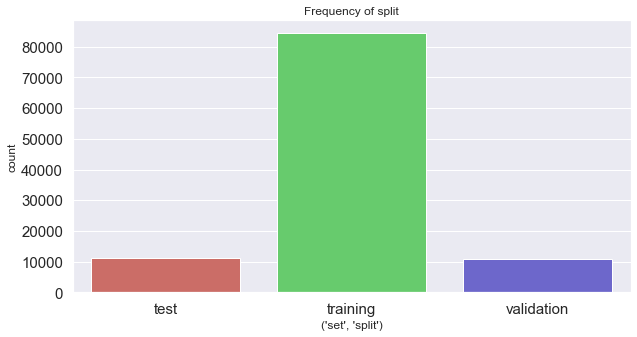

In [104]:
fig =plt.subplots(figsize=(10, 5))
sns.countplot(x=("set","split"), data=tracks, palette='hls')
plt.title('Frequency of split')
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.show()

In [105]:
tracks["set", "subset"].unique()

array(['small', 'medium', 'large'], dtype=object)

In [106]:
tracks["set", "subset"] = tracks["set", "subset"].astype("category")
tracks["set", "subset"].value_counts()

large     81574
medium    17000
small      8000
Name: (set, subset), dtype: int64

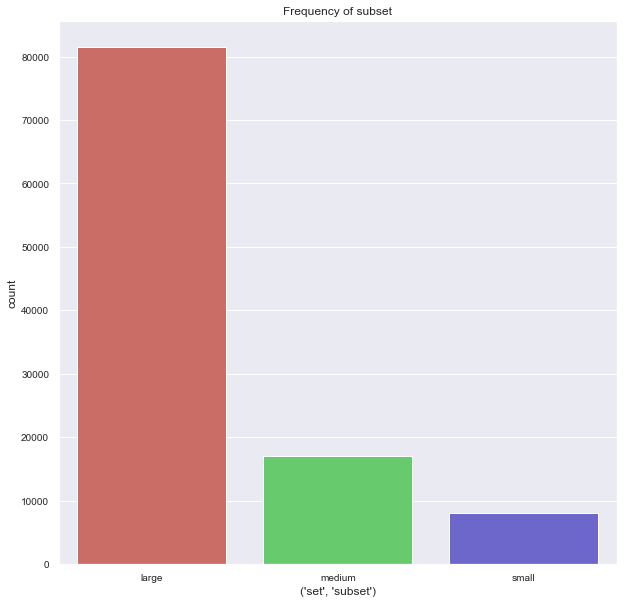

In [107]:
fig =plt.subplots(figsize=(10, 10))
sns.countplot(x=("set","subset"), data=tracks, palette='hls')
plt.title('Frequency of subset')
plt.yticks(fontsize=10)
plt.xticks(fontsize=10)
plt.show()

Analisi track, composer

In [108]:
tracks["track", "composer"].unique()

array([nan, 'Kurt Vile', 'Arc and Sender', 'James Squeaky', 'Luke Wyland',
       'Brian Chippendale', 'chris andrews', '?', 'Blah Blah Blah',
       'Borful Tang', 'Brian Joseph Davis',
       'Walter Bronhard + Dylan Going + Dave Public', 'Clockcleaner',
       'Clyde', 'Clyde "The Jackal" Rourke', 'Dorothy Geller',
       'Kyle Bruckmann and Ernst Karel', 'Ed Askew', 'El Jesus De Mágico',
       'Ethan Persoff', 'Food For Animals / Faust', 'Tara Burke',
       'Will Foster', 'Dan Burke', 'patty fair', 'Jad Fair',
       'Jason Willett', 'King Kong Ding Dong', 'Kyle Bruckmann',
       'Jeremy Harris', 'Lexie Mountain', 'Lexie Mountain Boys',
       'Tommy Jay', 'Mike Rep', 'David Harms', 'Mors Ontologica',
       'Mountain High',
       'Freematterfortheblind.com recordings- Retina scan reissue',
       'Nautical Almanac', 'Nick Andrews', 'nicky andrews',
       'Olivia Block', 'Fred Cole', 'Plastic Crimewave', 'Shawn Greenlee',
       'Ponytail', 'Dominic Cramp', 'Mason/Rourke',
   

In [109]:
tracks["track", "composer"] = tracks["track", "composer"].astype("category")
tracks["track", "composer"].value_counts()

konstantin trokai                       541
Chad Crouch                             465
J.S. Bach                               346
konstantin trokay                       223
Chris Zabriskie                          89
                                       ... 
Larry Austin                              1
Lavoura                                   1
Lee Rosevere                              1
Leffevre                                  1
LMM 1.12 - Contagious (October 2007)      1
Name: (track, composer), Length: 505, dtype: int64

In [166]:
#scommentare per avere l'output

#fig =plt.subplots(figsize=(40, 100))
#sns.countplot(y=("artist", "wikipedia_page"), data=tracks, palette='hls')
#plt.title('Frequency of associated labels')
#plt.yticks(fontsize=10)
#plt.xticks(fontsize=40)
#plt.show()

Analisi track, geners

In [111]:
print(tracks["track", "genres"])

track_id
2                  [21]
3                  [21]
5                  [21]
10                 [10]
20            [76, 103]
              ...      
155316             [25]
155317             [25]
155318             [25]
155319             [25]
155320    [10, 12, 169]
Name: (track, genres), Length: 106574, dtype: object


In [112]:
"".join([str(_) for _ in  tracks["track", "genres"]])

'[21][21][21][10][76, 103][76, 103][76, 103][76, 103][76, 103][21][45, 58][45, 58][1, 32][1, 32][17][17][17][17][4][4][4][4][1][1][1][25][25][26][26][26][30][30][30][30][30][30][30][30][30][30][30][30][30][25][25][25][25][25][25][25][25][25][25][25][27][27][27][27][27, 76][17][17][17][17][17][17][17][17][17][17][17][17][17][17][17][17][17][17][17][17][17][17][17][17][17][10][25][25][15, 92][4][4][12, 76][12][12, 76][12][12, 76][12, 76][12][12, 76][12, 76][12][31][31][31][32][32][32][32][32][32][32][32][32][32][32][32][32][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][89][15][15][15][15][12][12][12][15][15][15][15][15][15][15][15][15][15][15][15][15][15][15][15][15][15][1][1, 18][1][1, 18][1][1, 18][1, 18][1][1][1][1][1][1][1][1][1][1][1][1][1][1][1][1][4, 15, 38][4, 1

In [113]:
tracks["track", "genres"].value_counts()

[21]                    2735
[15]                    2689
[]                      2231
[12]                    1896
[1, 30, 38, 41, 247]    1633
                        ... 
[26, 42, 1235]             1
[64, 362]                  1
[20, 42]                   1
[41, 66, 85, 88]           1
[311, 456]                 1
Name: (track, genres), Length: 4768, dtype: int64

Genres all suppongo sia praticamente molto simile ma più numerosa quindi non la analizzo nel dettaglio

Analisi Track information

In [114]:
tracks["track", "information"].unique()

array([nan,
       '<p>Recorded live in downtown Los Angeles at the Lace Gallery, April 27, 1978.</p>',
       '<p>Unreleased</p>', ...,
       '<p style="margin:0px 0px 8px;padding:0px;font-size:13px;line-height:19px;color:rgb(34,34,34);">Composed and recorded by Andy G. Cohen. Released under a Creative Commons Attribution license.\xa0</p><p style="margin:0px 0px 8px;padding:0px;font-size:13px;line-height:19px;color:rgb(34,34,34);">A correct attribution looks like this:</p><p style="margin:0px 0px 8px;padding:0px;font-size:13px;line-height:19px;color:rgb(34,34,34);">Music: "Xi" by Andy G. Cohen</p><p style="margin:0px 0px 8px;padding:0px;font-size:13px;line-height:19px;color:rgb(34,34,34);">http://andyg.co/hen</p>',
       '<p>Hope you enjoy my spin on some good ole Eastern Appalachian music. :)</p>',
       '<p>All Words &amp; Melody Written &amp; produced By Nick Myer for AGENDA 23. Female Vocals performed by: C</p>'],
      dtype=object)

In [115]:
tracks["track", "information"] = tracks["track", "information"].astype("category")
tracks["track", "information"].value_counts()

<p><a href="http://www.myspace.com/theshamblers">The Shamblers</a> shambled down from Bay Ridge, Brooklyn to grace us with a live performance last Wednesday.&nbsp; Led by husband/wife team of Peter and Jess Speer, and ably augmented by drummer Ben Truesdale, the Shamblers brought their blend of Beat Happening/Home Blitz pop roughness plus classic garage punk action with lyrics to match.&nbsp; More info at <a href="http://www.colonialrecordingsusa.com/">their label site</a> (where you can purchase their 100-song mp3 album) and <a href="http://theshamblers.blogspot.com/">their blog</a>.&nbsp; The full set, plus two FCC-unfriendly bonus tracks found below.&nbsp; Engineered by Trent Wolbe.&nbsp; You've been shambled.</p>\n<p><a href="http://blog.wfmu.org/freeform/2008/07/the-shamblers-l.html" target="_blank">http://blog.wfmu.org/freeform/2008/07/the-shamblers-l.html</a></p>\n<p><a href="http://www.wfmu.org/playlists/shows/27951" target="_blank">http://www.wfmu.org/playlists/shows/27951</a>

Analisi track,language code

In [116]:
tracks["track", "language_code"].unique()

array(['en', 'es', nan, 'fi', 'pt', 'tr', 'sw', 'el', 'ar', 'pl', 'id',
       'tw', 'eu', 'ms', 'fr', 'ty', 'hy', 'hi', 'vi', 'ja', 'tl', 'it',
       'my', 'gu', 'zh', 'uk', 'az', 'sr', 'lt', 'th', 'bg', 'de', 'no',
       'ko', 'uz', 'ka', 'ha', 'sk', 'nl', 'bm', 'ru', 'he', 'cs', 'la',
       'ee'], dtype=object)

In [117]:
tracks["track", "language_code"] = tracks["track", "language_code"].astype("category")
tracks["track", "language_code"].value_counts()

en    14255
es      204
fr      191
pt       81
de       68
ru       30
it       28
tr       25
sr       23
pl       12
he       12
ar       12
el        7
ee        7
bg        7
sw        6
ja        6
fi        6
cs        5
nl        5
hi        3
id        3
zh        3
vi        2
az        2
hy        2
ms        2
th        1
uz        1
bm        1
uk        1
ty        1
tw        1
tl        1
eu        1
sk        1
ko        1
no        1
my        1
gu        1
ha        1
lt        1
la        1
ka        1
Name: (track, language_code), dtype: int64

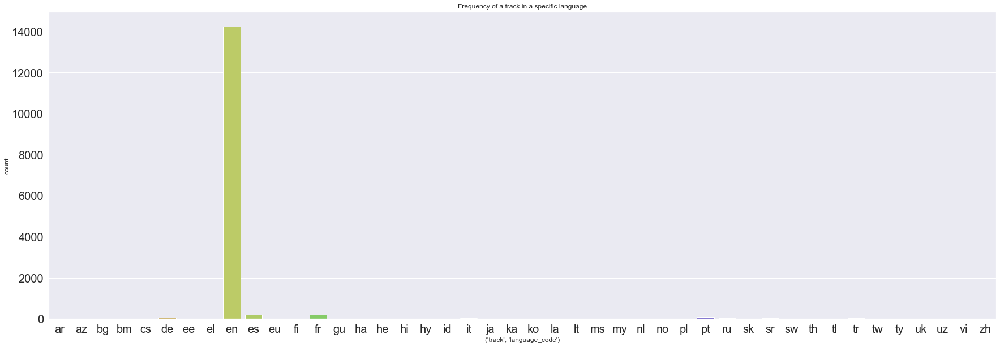

In [118]:
fig =plt.subplots(figsize=(30, 10))
sns.countplot(x=("track","language_code"), data=tracks, palette='hls')
plt.title('Frequency of a track in a specific language')
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.show()

Analisi tracks, lyricist

In [119]:
tracks["track", "lyricist"].unique()

array([nan, 'David Lineal', 'Jad Fair', 'Chhom Nimol', 'Kurt Vile',
       'Ben Jacobs', 'Brian Kelly', 'Sami Abu Shumays', 'daniel seward',
       'meg baird', 'Bobb Trimble', 'Xeth Feinberg', 'traditional',
       'Brendan Quinn', 'The Lost Demension', 'Ed Caspers',
       'Jasmine Love Bomb', 'Raphaella Seward', 'Andy Unlearny',
       'Jason Hodges', 'David Marie-Garland', 'Lewis Carroll',
       'Murk Wuite', 'Sarah Assbring', 'Wesley Willis', 'Arthur Wilson',
       'Aisha Rahman ', 'Aisha Rahmen ', ' Brian Wesley Smith',
       'Langston Hughes', 'Philip Lynch', 'Colin Molter', 'Robert Price',
       'Reggie Regan', 'Tom Ray / Mark Whitcomb', 'Kendall WA',
       'Decade in Exile', 'Mike Else', 'Richard Stallman',
       'Shadow Entity Wizard', 'Jenny Mayhem', 'Ebsa and Barraco Parra',
       'Wayne Myers', 'Andre Owen', 'Steven Arntson', 'Daniel Kisters',
       'Kirk Pearson', 'Dyke B', 'Eddie Palmer', 'Apache Tomcat',
       'Kathleen A. Martin', 'Traditional', 'Kathleen Mart

In [120]:
tracks["track", "lyricist"] = tracks["track", "lyricist"].astype("category")
tracks["track", "lyricist"].value_counts()

Apache Tomcat                       44
Wayne Myers                         24
Shadow Entity Wizard                19
Wesley Willis                       18
Kathleen Martin                     14
                                    ..
Jenny Mayhem                         1
Lobo Loco (Wolf Schweizer-Gerth)     1
Kathleen A. Martin                   1
Langston Hughes                      1
 Brian Wesley Smith                  1
Name: (track, lyricist), Length: 66, dtype: int64

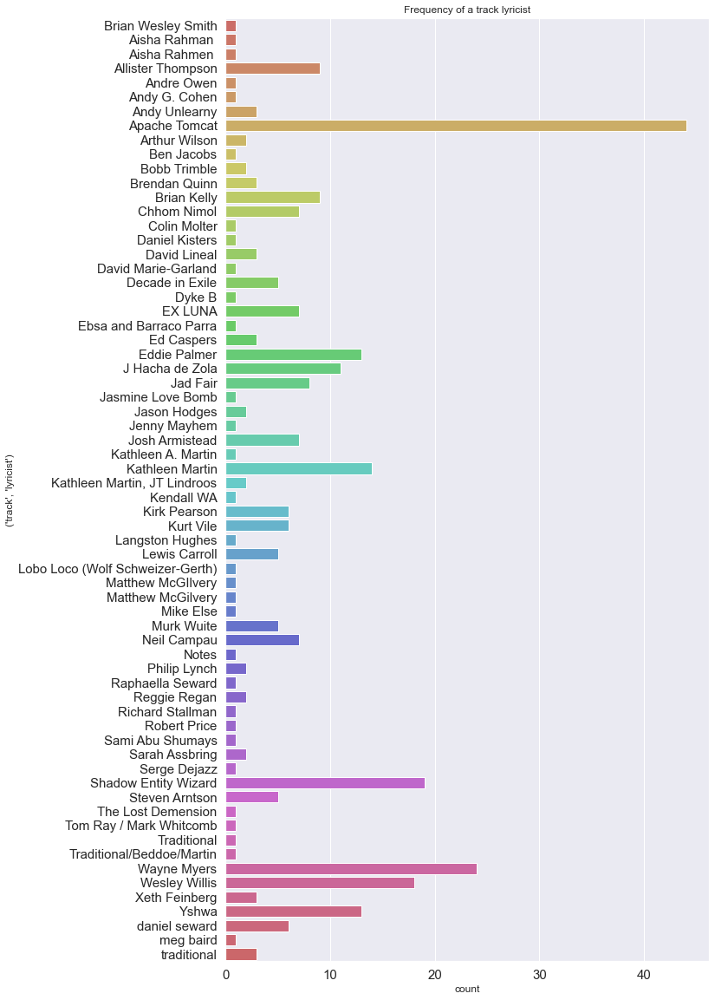

In [121]:
fig =plt.subplots(figsize=(10, 20))
sns.countplot(y=("track","lyricist"), data=tracks, palette='hls')
plt.title('Frequency of a track lyricist')
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.show()

Analisi track, publisher

In [122]:
tracks["track", "publisher"].unique()

array([nan, 'Cherry Red Music (UK)', 'Siltbreeze', 'WFMU', 'Levontin7',
       'dual plover', 'Halas.am', 'C.N.P. Records', 'CNP Records',
       'me my moe music', 'David Marie-Garland',
       'Zen Schlubbo Music, BMI', 'Beep! Beep! Back up the Truck',
       '8bitpeoples', 'Urlyd.com', 'Columbia A3339', 'Victor 16226',
       'Victor 17350', 'Columbia A3375', 'Victor 45202', 'Victor 18945',
       'Edison', 'Victor 18547', 'Victor 18891', 'Monarch 1826',
       'Victor 45137', 'Columbia A 2283', 'Columbia 800', 'Oxford 4828',
       'Columbia A2505', 'Columbia A1105', 'Columbia A2815',
       'Columbia A2283', 'Columbia A6231', 'Brunswick 2167',
       'Victor 5228', 'Victor 45305', 'Columbia A2417', 'Victor 87',
       'Victor 4427', 'Columbia 1544', 'OKeh 4310', 'Columbia A3412',
       'Victor 18809', 'Victor 18276', 'Victor 16897', 'Columbia A2539',
       'Victor 18595', 'Columbia A2730', 'Everlasting 3056', 'OKeh 4228',
       'Victor 16488', 'Victor 16413', 'Victor 18839', 'V

In [123]:
tracks["track", "publisher"] = tracks["track", "publisher"].astype("category")
tracks["track", "publisher"].value_counts()

Victrola Dog (ASCAP)                           465
You've Been a Wonderful Laugh Track (ASCAP)     84
Section 27                                      73
www.headphonica.com                             55
Studio 11                                       43
                                              ... 
Section 27 Netlabel                              1
Siltbreeze                                       1
Zen Schlubbo Music                               1
Victor 87                                        1
(Children of Hoof Music, BMI)                    1
Name: (track, publisher), Length: 135, dtype: int64

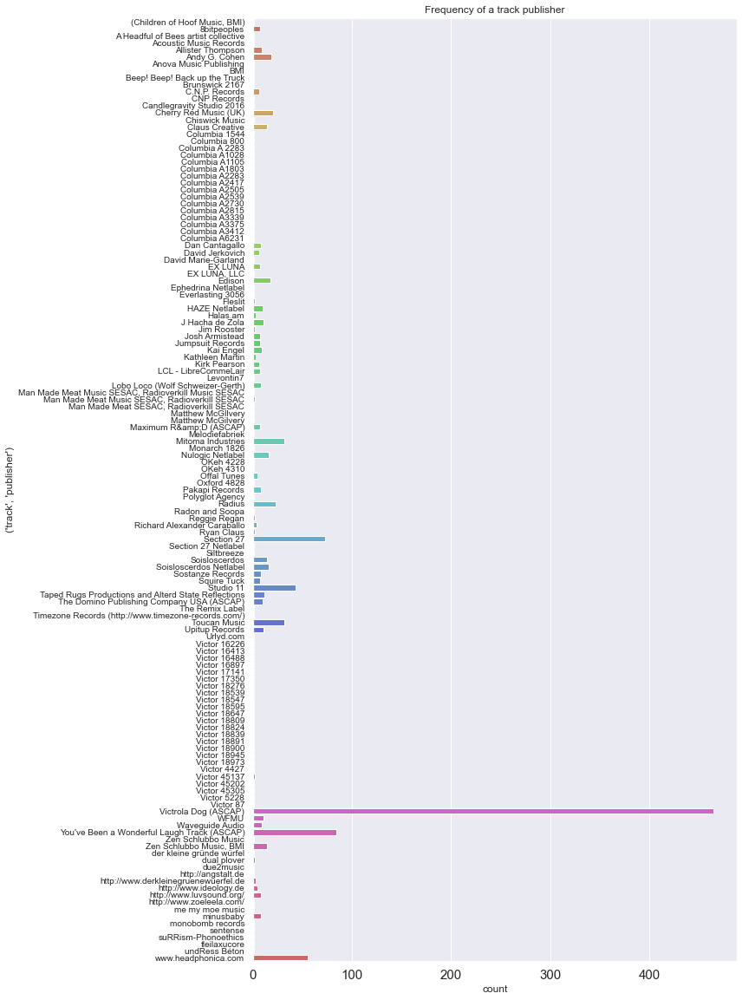

In [124]:
fig =plt.subplots(figsize=(10, 20))
sns.countplot(y=("track","publisher"), data=tracks, palette='hls')
plt.title('Frequency of a track publisher')
plt.yticks(fontsize=10)
plt.xticks(fontsize=15)
plt.show()

Analisi track, tags

In [125]:
print(tracks["track", "tags"])

track_id
2                                                        []
3                                                        []
5                                                        []
10                                                       []
20                                                       []
                                ...                        
155316                                                   []
155317                                                   []
155318                                                   []
155319                                                   []
155320    [ballad, epic, rockabilly, curse, hex, hard ro...
Name: (track, tags), Length: 106574, dtype: object


In [126]:
"".join([str(_) for _ in  tracks["track", "tags"]])

"[][][][][][][][][][][][]['lafms']['lafms'][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][][

In [127]:
tracks["track", "tags"].value_counts()

[]                                                                                                                                                         83078
[interiors c1964, existential, hardcore-punk, pop-punk, punk-rock, internet boyfriend, rew starr, public domain, creative commons, microsong challenge]      310
[classwar karaoke]                                                                                                                                           238
[all styles experimental]                                                                                                                                    215
[improvisation, not normal music, all styles experimental]                                                                                                   195
                                                                                                                                                           ...  
[psych-rock, rock, pop]           

Analisi Track title

In [128]:
tracks["track", "title"].unique()

array(['Food', 'Electric Ave', 'This World', ...,
       'My House Smells Like Kim Deal/Pulp', 'The Man With Two Mouths',
       'Another Trick Up My Sleeve (Instrumental)'], dtype=object)

In [129]:
tracks["track", "title"] = tracks["track", "title"].astype("category")
tracks["track", "title"].value_counts()

Untitled                                     298
Into Infinity "ear" loop                     150
Intro                                        115
Interview                                     92
Chicken and Cheese 2 (Foot Village cover)     49
                                            ... 
Sally Sally                                    1
Sally Smoked Dope By The Seashore              1
Sally in the Garden Sifting Sand               1
Salm                                           1
!!!!!                                          1
Name: (track, title), Length: 94986, dtype: int64

# Analisi Valori DATETIME

In [130]:
df_mod = tracks.select_dtypes(include=['datetime64'])
df_mod.dtypes

album   date_created         datetime64[ns]
        date_released        datetime64[ns]
artist  active_year_begin    datetime64[ns]
        active_year_end      datetime64[ns]
        date_created         datetime64[ns]
track   date_created         datetime64[ns]
        date_recorded        datetime64[ns]
dtype: object

Analisi Album,date_created

In [131]:
tracks["album", "date_created"].unique()

array(['2008-11-26T01:44:45.000000000', '2008-11-26T01:45:08.000000000',
       '2008-11-26T01:45:05.000000000', ...,
       '2017-03-30T10:45:13.000000000', '2017-03-30T12:51:05.000000000',
       '2017-03-30T15:20:35.000000000'], dtype='datetime64[ns]')

In [132]:
tracks["album", "date_created"].value_counts()

2015-01-26 13:04:57    310
2009-03-30 16:18:08    151
2016-11-12 12:34:46    150
2012-12-06 16:45:52    139
2009-01-02 21:41:31    138
                      ... 
2010-09-28 12:57:08      1
2011-12-23 08:07:13      1
2013-05-28 13:18:56      1
2008-11-26 02:54:35      1
2009-04-09 12:10:48      1
Name: (album, date_created), Length: 14340, dtype: int64

C:\Users\jigok\anaconda3\lib\site-packages\numpy\lib\histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\jigok\anaconda3\lib\site-packages\numpy\lib\histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


(array([733042.00000579, 733408.00000579, 733773.00000579, 734138.00000579,
        734503.00000579, 734869.00000579, 735234.00000579, 735599.00000579,
        735964.00000579, 736330.00000579]),
 <a list of 10 Text major ticklabel objects>)

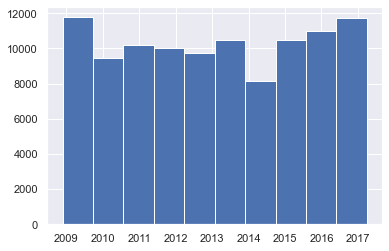

In [133]:
tracks = tracks.sort_values(("album", "date_created"), ascending=True)
plt.hist(tracks["album", "date_created"])
plt.xticks(rotation='horizontal')


In [134]:
tracks['Month-ADateCreated']=pd.to_datetime(tracks["album", "date_created"]).dt.month
tracks['Year-ADateCreated']=pd.to_datetime(tracks["album", "date_created"], format='%d/%m/%Y %H:%M:%S').dt.year
tracks['Day-ADateCreated']=pd.to_datetime(tracks["album", "date_created"], format='%d/%m/%Y %H:%M:%S').dt.day

In [135]:
del tracks["album", "date_created"]

(array([ 0.,  2.,  4.,  6.,  8., 10., 12., 14.]),
 <a list of 8 Text major ticklabel objects>)

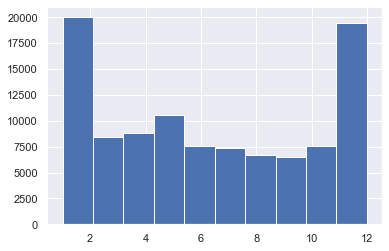

In [136]:
tracks = tracks.sort_values(('Month-ADateCreated'), ascending=True)
plt.hist(tracks['Month-ADateCreated'])
plt.xticks(rotation='horizontal')


(array([2006., 2008., 2010., 2012., 2014., 2016., 2018.]),
 <a list of 7 Text major ticklabel objects>)

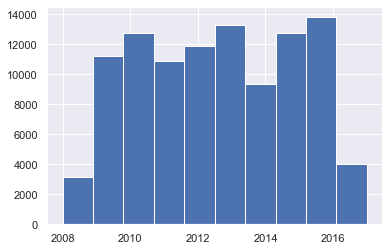

In [137]:
tracks = tracks.sort_values(('Year-ADateCreated'), ascending=True)
plt.hist(tracks['Year-ADateCreated'])
plt.xticks(rotation='horizontal')

(array([-5.,  0.,  5., 10., 15., 20., 25., 30., 35.]),
 <a list of 9 Text major ticklabel objects>)

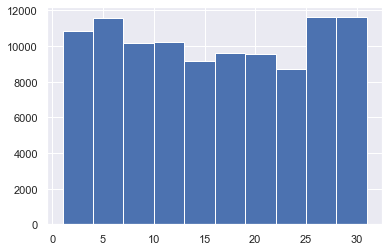

In [138]:
tracks = tracks.sort_values(('Day-ADateCreated'), ascending=True)
plt.hist(tracks['Day-ADateCreated'])
plt.xticks(rotation='horizontal')

Analisi Album Date,released

In [139]:
tracks["album", "date_released"].value_counts()

2008-01-01    667
2010-01-01    564
2007-01-01    549
2009-01-01    464
2006-01-01    330
             ... 
2012-06-09      1
2008-06-29      1
2008-12-26      1
2006-12-16      1
2001-03-13      1
Name: (album, date_released), Length: 3669, dtype: int64

(array([686291., 693596., 700900., 708205., 715510., 722815., 730120.,
        737425., 744730.]),
 <a list of 9 Text major ticklabel objects>)

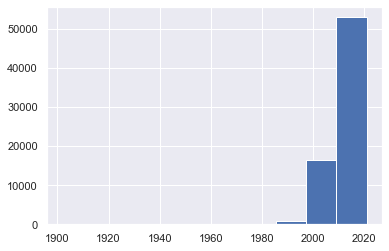

In [140]:
tracks = tracks.sort_values(("album", "date_released"), ascending=True)
plt.hist(tracks["album", "date_released"])
plt.xticks(rotation='horizontal')

*Analisi Artist,activeYear Begin

In [141]:
tracks["artist", "active_year_begin"].value_counts()

2007-01-01    1789
2005-01-01    1534
2008-01-01    1468
2006-01-01    1352
2004-01-01    1237
              ... 
1954-01-01       1
1917-01-01       1
1931-01-01       1
1948-01-01       1
1959-01-01       1
Name: (artist, active_year_begin), Length: 76, dtype: int64

(array([686291., 693596., 700900., 708205., 715510., 722815., 730120.,
        737425., 744730.]),
 <a list of 9 Text major ticklabel objects>)

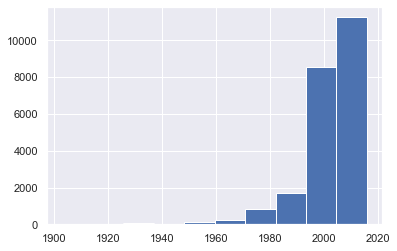

In [142]:
tracks = tracks.sort_values(("artist", "active_year_begin"), ascending=True)
plt.hist(tracks["artist", "active_year_begin"])
plt.xticks(rotation='horizontal')

Analisi Artist, active year end

In [143]:
tracks["artist", "active_year_end"].value_counts()

2016-01-01    479
2015-01-01    476
2014-01-01    455
2007-01-01    356
2010-01-01    321
2017-01-01    289
2011-01-01    272
2009-01-01    252
2013-01-01    245
2008-01-01    225
2005-01-01    218
2012-01-01    210
1995-01-01    189
2018-01-01    150
2053-01-01    149
1989-01-01    127
2000-01-01    117
2001-01-01     94
2006-01-01     92
1999-01-01     68
2036-01-01     61
1998-01-01     56
1993-01-01     51
2002-01-01     51
2003-01-01     47
2004-01-01     43
1983-01-01     36
1992-01-01     32
1996-01-01     29
1975-01-01     28
1997-01-01     27
2086-01-01     21
1945-01-01     12
1950-01-01     12
1994-01-01     11
2025-01-01     11
1991-01-01     10
1985-01-01      7
1980-01-01      6
1929-01-01      5
1928-01-01      5
1922-01-01      4
1957-01-01      4
1927-01-01      4
1917-01-01      3
1935-01-01      2
1976-01-01      2
1913-01-01      2
1926-01-01      1
1948-01-01      1
1931-01-01      1
1958-01-01      1
1937-01-01      1
1910-01-01      1
1932-01-01      1
1903-01-01

(array([686291., 700900., 715510., 730120., 744730., 759340., 773949.]),
 <a list of 7 Text major ticklabel objects>)

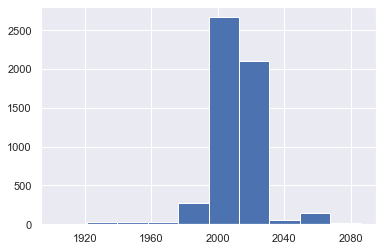

In [144]:
tracks = tracks.sort_values(("artist", "active_year_end"), ascending=True)
plt.hist(tracks["artist", "active_year_end"])
plt.xticks(rotation='horizontal')

Analisi Artist, date_created

In [145]:
tracks["artist", "date_created"].value_counts()

2013-03-31 02:17:41    745
2010-04-19 14:21:56    604
2008-11-26 02:09:09    499
2015-02-03 12:05:36    416
2009-03-19 12:01:38    371
                      ... 
2015-07-01 03:07:57      1
2009-06-10 12:48:24      1
2012-12-31 21:46:50      1
2013-04-21 20:51:02      1
2013-12-30 17:15:59      1
Name: (artist, date_created), Length: 15970, dtype: int64

(array([733042.00000231, 733408.00000231, 733773.00000231, 734138.00000231,
        734503.00000231, 734869.00000231, 735234.00000231, 735599.00000231,
        735964.00000231, 736330.00000231]),
 <a list of 10 Text major ticklabel objects>)

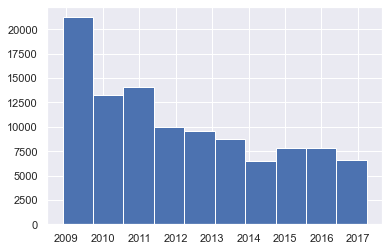

In [146]:
tracks = tracks.sort_values(("artist", "date_created"), ascending=True)
plt.hist(tracks["artist", "date_created"])
plt.xticks(rotation='horizontal')

Analisi track, datecreated

In [147]:
tracks["track", "date_created"].value_counts()

2009-05-09 11:28:24    4
2009-04-05 19:27:36    4
2009-04-05 19:16:59    4
2009-04-20 22:30:54    4
2009-03-06 13:40:36    4
                      ..
2011-03-07 19:41:18    1
2015-05-07 16:14:43    1
2013-03-30 17:04:48    1
2010-12-20 19:37:34    1
2012-07-30 23:33:04    1
Name: (track, date_created), Length: 86169, dtype: int64

(array([733042.00000405, 733408.00000405, 733773.00000405, 734138.00000405,
        734503.00000405, 734869.00000405, 735234.00000405, 735599.00000405,
        735964.00000405, 736330.00000405]),
 <a list of 10 Text major ticklabel objects>)

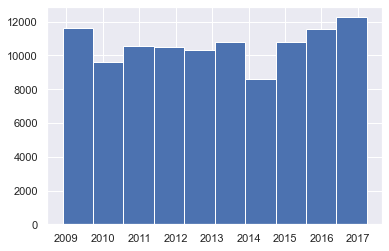

In [148]:
tracks = tracks.sort_values(("track", "date_created"), ascending=True)
plt.hist(tracks["track", "date_created"])
plt.xticks(rotation='horizontal')

Analisi track,date registered

In [149]:
tracks["track", "date_recorded"].value_counts()

2008-11-26    700
1997-01-01    141
2003-01-01    124
2006-01-01    110
2008-12-05    105
             ... 
2003-09-13      1
2009-12-17      1
2004-04-28      1
2012-03-04      1
2006-07-15      1
Name: (track, date_recorded), Length: 773, dtype: int64

(array([686291., 693596., 700900., 708205., 715510., 722815., 730120.,
        737425., 744730.]),
 <a list of 9 Text major ticklabel objects>)

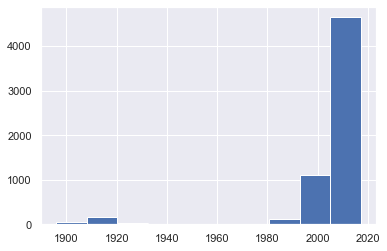

In [150]:
tracks = tracks.sort_values(("track", "date_recorded"), ascending=True)
plt.hist(tracks["track", "date_recorded"])
plt.xticks(rotation='horizontal')

# Analisi valori CATEGORY

In [151]:
df_mod = tracks.select_dtypes(include=['category'])
df_mod.dtypes

album   engineer             category
        information          category
        producer             category
        title                category
        type                 category
artist  associated_labels    category
        bio                  category
        location             category
        members              category
        name                 category
        related_projects     category
        website              category
        wikipedia_page       category
set     split                category
        subset               category
track   composer             category
        genre_top            category
        information          category
        language_code        category
        license              category
        lyricist             category
        publisher            category
        title                category
dtype: object

Analisi Album, Information

In [152]:
tracks["album", "information"].value_counts()

<p class="p1" style="margin: 0px; padding: 8px 0px; font-stretch: normal; font-size: 12px; line-height: 19px; font-family: 'Trebuchet MS', 'Lucida Grande', Arial, sans-serif; color: #222222;"><span class="s1">Get ready, get set, GET SMALL! Get your tiny instruments together (or oversized ones, or ones that are juuuust right), grab a recording device, and add your itty bitty masterpiece(s) to our collection! Every microSong will be licensed under a <a href="http://creativecommons.org/about/cc0">Creative Commons Zero</a> license so that it can be freely used by anyone in a video, remix, extraordinarily brief performance art piece, or whatever else they may choose.</span></p>\n<p class="p1" style="margin: 0px; padding: 8px 0px; font-stretch: normal; font-size: 12px; line-height: 19px; font-family: 'Trebuchet MS', 'Lucida Grande', Arial, sans-serif; color: #222222;"><span class="s1">Songs must be your own work, and must not exceed fifteen (15) seconds in length. We only accept MP3 submissi

In [153]:
tracks["album", "information"].unique()

[<p>Part of the <a href="http://cylinders.libra..., <p><a href="http://www.wfmu.org/playlists/show..., NaN, <p>Music from the <a title="WFMU" href="http:/..., <p>Music from the <a title="WFMU" href="http:/..., ..., <p>A live performance on WFMU for Shrunken Pla..., <p>This album is about volatile things and mom..., <p>The stars will show you the way in this unp..., <p>Scott welcomes Russian revolutionary avant ..., <p>A live performance at Monty Hall on Feb 17,...]
Length: 11076
Categories (11075, object): [<p>Part of the <a href="http://cylinders.libra..., <p><a href="http://www.wfmu.org/playlists/show..., <p>Music from the <a title="WFMU" href="http:/..., <p>Music from the <a title="WFMU" href="http:/..., ..., <p>This album is about volatile things and mom..., <p>The stars will show you the way in this unp..., <p>Scott welcomes Russian revolutionary avant ..., <p>A live performance at Monty Hall on Feb 17,...]

Analisi Album,type

In [154]:
tracks[("album", "type")]

track_id
5027                 Album
16387        Radio Program
16393        Radio Program
10086                Album
16394        Radio Program
                ...       
155315    Live Performance
155316    Live Performance
155317    Live Performance
155318    Live Performance
155319    Live Performance
Name: (album, type), Length: 106574, dtype: category
Categories (5, object): [Album, Contest, Live Performance, Radio Program, Single Tracks]

In [155]:
tracks[("album", "type")].value_counts()

Album               87549
Radio Program        6551
Live Performance     5035
Single Tracks         917
Contest                14
Name: (album, type), dtype: int64

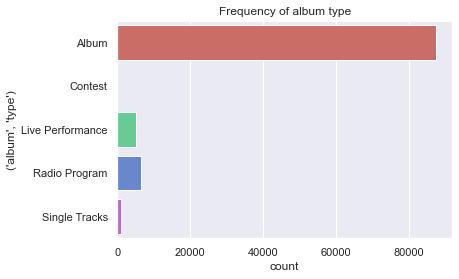

In [156]:
sns.countplot(y=("album", "type"), data=tracks, palette='hls')
plt.title('Frequency of album type')
plt.show()

Analisi artist bio

In [157]:
tracks["artist", "bio"].value_counts()

<p><span style="color: #333333; font-family: Georgia, 'Times New Roman', 'Bitstream Charter', Times, serif; font-size: 13px; line-height: 19px; text-align: left;">Kosta T / Konstantin Trokay is a formative Russian musician with an interest in contemporary music, looking for new ways of expressing his particular world view...</span></p>                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

Analisi track,genre_top

In [158]:
tracks[("track", "genre_top")]

track_id
5027      Old-Time / Historic
16387     Old-Time / Historic
16393     Old-Time / Historic
10086     Old-Time / Historic
16394     Old-Time / Historic
                 ...         
155315                   Rock
155316                   Rock
155317                   Rock
155318                   Rock
155319                   Rock
Name: (track, genre_top), Length: 106574, dtype: category
Categories (16, object): [Blues, Classical, Country, Easy Listening, ..., Pop, Rock, Soul-RnB, Spoken]

In [159]:
tracks[("track", "genre_top")].value_counts()

Rock                   14182
Experimental           10608
Electronic              9372
Hip-Hop                 3552
Folk                    2803
Pop                     2332
Instrumental            2079
International           1389
Classical               1230
Jazz                     571
Old-Time / Historic      554
Spoken                   423
Country                  194
Soul-RnB                 175
Blues                    110
Easy Listening            24
Name: (track, genre_top), dtype: int64

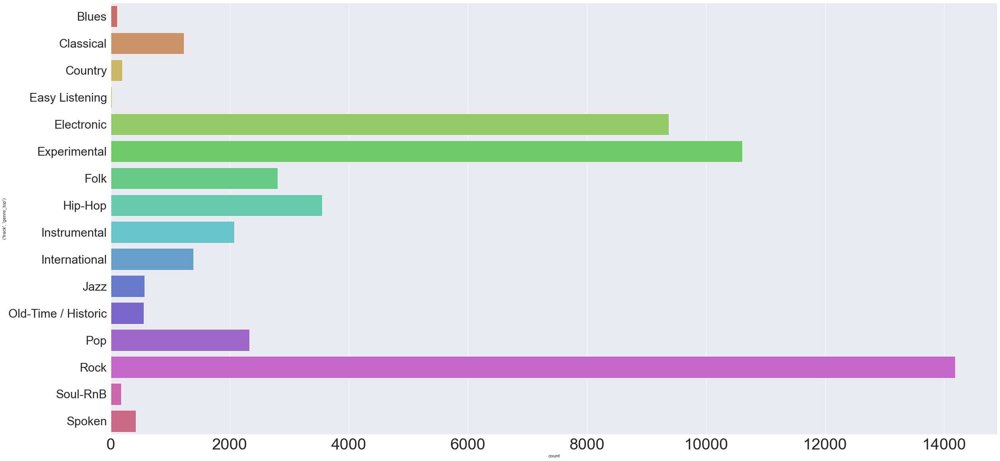

In [160]:
fig =plt.subplots(figsize=(40, 20))
ax = sns.countplot(y=("track", "genre_top"), data=tracks, palette='hls')
plt.yticks(fontsize=30)
plt.xticks(fontsize=40)
plt.show()

Analisi track,license

In [161]:
tracks["track", "license"].value_counts()

Attribution-Noncommercial-Share Alike 3.0 United States                          19250
Attribution-NonCommercial-NoDerivatives (aka Music Sharing) 3.0 International    17732
Attribution-NonCommercial-ShareAlike 3.0 International                           15260
Creative Commons Attribution-NonCommercial-NoDerivatives 4.0                     12133
Attribution-Noncommercial-No Derivative Works 3.0 United States                  10584
                                                                                 ...  
Attribution-Noncommercial-NoDerivatives 2.0 Belgium                                  1
Attribution-Noncommercial 2.5 Brazil                                                 1
Attribution-Noncommercial-No Derivative Works 2.5 Sweden                             1
Attribution-Noncommercial-No Derivative Works 2.5 Denmark                            1
Attribution-Noncommercial-No Derivative Works 2.5 Portugal                           1
Name: (track, license), Length: 113, dtype:

In [167]:
#scommentare per avere l'output

#fig =plt.subplots(figsize=(60, 200))
#ax = sns.countplot(y=("track", "license"), data=tracks, palette='hls')
#plt.yticks(fontsize=30)
#plt.xticks(fontsize=40)
#plt.show()